In [41]:
# Define URLs
h5_url <- "https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSM7777523&format=file&file=GSM7777523%5FD1%5Ffiltered%5Ffeature%5Fbc%5Fmatrix%2Eh5"
tar_gz_url <- "https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSM7777523&format=file&file=GSM7777523%5FD1%5Fspatial%2Etar%2Egz"

# Define file names
h5_file <- "D1_filtered_feature_bc_matrix.h5"
tar_gz_file <- "D1_spatial.tar.gz"

# Download files
download.file(h5_url, destfile = h5_file, mode = "wb")  # mode = "wb" ensures binary download
download.file(tar_gz_url, destfile = tar_gz_file, mode = "wb")

In [42]:
untar(tar_gz_file, exdir = "D1_spatial")

In [43]:
dir.create("D1", showWarnings = FALSE)


In [44]:
file.rename("/kaggle/working/D1_filtered_feature_bc_matrix.h5", "D1/D1_filtered_feature_bc_matrix.h5")
file.rename("D1_spatial", "D1/D1_spatial")


[1] TRUE

[1] TRUE

In [45]:
file.remove('/kaggle/working/D1_spatial.tar.gz')

[1] TRUE

In [5]:
custom_lib <- "/kaggle/working/KO"  
default_lib <- .libPaths()[1] 
#
packages <- list.dirs(custom_lib, full.names = TRUE, recursive = FALSE)

# move packages from custom to default library path
for (pkg in packages) {
  pkg_name <- basename(pkg)  
  target_path <- file.path(default_lib, pkg_name)
  
  # check if the package already exists in the default path
  if (!dir.exists(target_path)) {
    file.copy(pkg, default_lib, recursive = TRUE)
  } else {
    message(paste("package already exists in default library:", pkg_name))
  }
}
print('-----------------All packages are moved----------------------')

[1] "-----------------All packages are moved----------------------"


In [ ]:
custom_lib <- "/kaggle/input/library-data/my_r_libs"  
default_lib <- .libPaths()[1] 

packages <- list.dirs(custom_lib, full.names = TRUE, recursive = FALSE)

# move packages from custom to default library path
for (pkg in packages) {
  pkg_name <- basename(pkg)  
  target_path <- file.path(default_lib, pkg_name)
  
  # check if the package already exists in the default path
  if (!dir.exists(target_path)) {
    file.copy(pkg, default_lib, recursive = TRUE)
  } else {
    message(paste("package already exists in default library:", pkg_name))
  }
}
print('-----------------All packages are moved----------------------')

In [17]:
# BiocManager::install('STexampleData')
# library(STexampleData)
library(ggspavis)
library(ggplot2)
library(scater)
library(scran)
library(igraph)
library(pheatmap)
library(ggExtra)
library(nnSVG)
library(scater)
library(scran)
library(scry)
library(SPARK)
library(harmony)
library(Seurat)
library(spatialLIBD)
library(KODAMAextra)
library(mclust)
library(slingshot)
library(irlba)
library(dplyr)
library(hdf5r)
library(Matrix)
library(Seurat)
library(ggplot2)
library(patchwork)
library(dplyr)


In [18]:
library(Seurat)
library(KODAMA)
library(KODAMAextra)
library(SPARK)
install.packages('Rnanoflann')

In [60]:
# making all figures bigger
options(repr.plot.width = 15, repr.plot.height = 10)

In [6]:
clusters_colors=c('#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
       '#e377c2', '#7f7f7f', '#bcbd22', '#17becf')

In [7]:
files <- c("A1", "B1", "C1", "D1")  # List of tissue names
st <- list()  # Empty list to store Seurat objects


In [8]:
for (file in files) {
  # Read count matrix
  matrix_path <- paste0("/kaggle/working/", file, "/", file, "_filtered_feature_bc_matrix.h5")
  matrix <- Read10X_h5(matrix_path)
  
  # Read spatial image
  img_path <- paste0("/kaggle/working/", file, "/", "spatial")
  img <- Read10X_Image(img_path)
  
  # Create Seurat object
  seurat_obj <- CreateSeuratObject(counts = matrix, assay = "Spatial")
  
  # Add spatial image to Seurat object
  seurat_obj@images$spatial <- img
  
  # Add tissue metadata
  seurat_obj$Tissue <- file
  
  # Store in list
  st[[file]] <- seurat_obj
}


In [9]:
st$A1

An object of class Seurat 
36601 features across 1333 samples within 1 assay 
Active assay: Spatial (36601 features, 0 variable features)
 1 layer present: counts
 1 spatial field of view present: spatial

In [24]:
head(st$A1@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,Tissue,log10GenesPerUMI,mitoRatio
,<fct>,<dbl>,<int>,<chr>,<dbl>,<dbl>
AAACCGGGTAGGTACC-1,SeuratProject,5853,2114,A1,0.8826044,0.01674355
AAACCTCATGAAGTTG-1,SeuratProject,2550,1279,A1,0.9120311,0.02156863
AAACGAGACGGTTGAT-1,SeuratProject,452,364,A1,0.9645830,0.01769912
AAACTGCTGGCTCCAA-1,SeuratProject,654,455,A1,0.9440376,0.02752294
AAAGACTGGGCGCTTT-1,SeuratProject,11713,3202,A1,0.8615648,0.01092803
AAAGGCTCTCGCGCCG-1,SeuratProject,1336,665,A1,0.9030699,0.08008982


# Qc

In [ ]:
for (tissue_name in names(st)) {
    data <- st[[tissue_name]]

    data$log10GenesPerUMI <- log10(data$nFeature_Spatial) / log10(data$nCount_Spatial)

    data$mitoRatio <- PercentageFeatureSet(object = data, pattern = "^MT-")
    
    data$mitoRatio <- data@meta.data$mitoRatio / 100

    st[[tissue_name]] <- data
}


In [12]:
head(st$B1)

,orig.ident,nCount_Spatial,nFeature_Spatial,Tissue,log10GenesPerUMI,mitoRatio
,<fct>,<dbl>,<int>,<chr>,<dbl>,<dbl>
AAACACCAATAACTGC-1,SeuratProject,23513,6215,B1,0.8678046,0.02679369
AAACCGGGTAGGTACC-1,SeuratProject,7404,3292,B1,0.9090297,0.08130740
AAACCGTTCGTCCAGG-1,SeuratProject,1381,896,B1,0.9401675,0.11658219
AAACTGCTGGCTCCAA-1,SeuratProject,1566,1007,B1,0.9399766,0.07024266
AAACTTAATTGCACGC-1,SeuratProject,21210,5822,B1,0.8702269,0.02173503
AAACTTGCAAACGTAT-1,SeuratProject,8717,3807,B1,0.9086927,0.08018814
AAAGAATGACCTTAGA-1,SeuratProject,17574,5225,B1,0.8759010,0.06179583
AAAGGCCCTATAATAC-1,SeuratProject,6995,2850,B1,0.8985788,0.09535382
AAAGGCTCTCGCGCCG-1,SeuratProject,5664,2469,B1,0.9039194,0.04096045


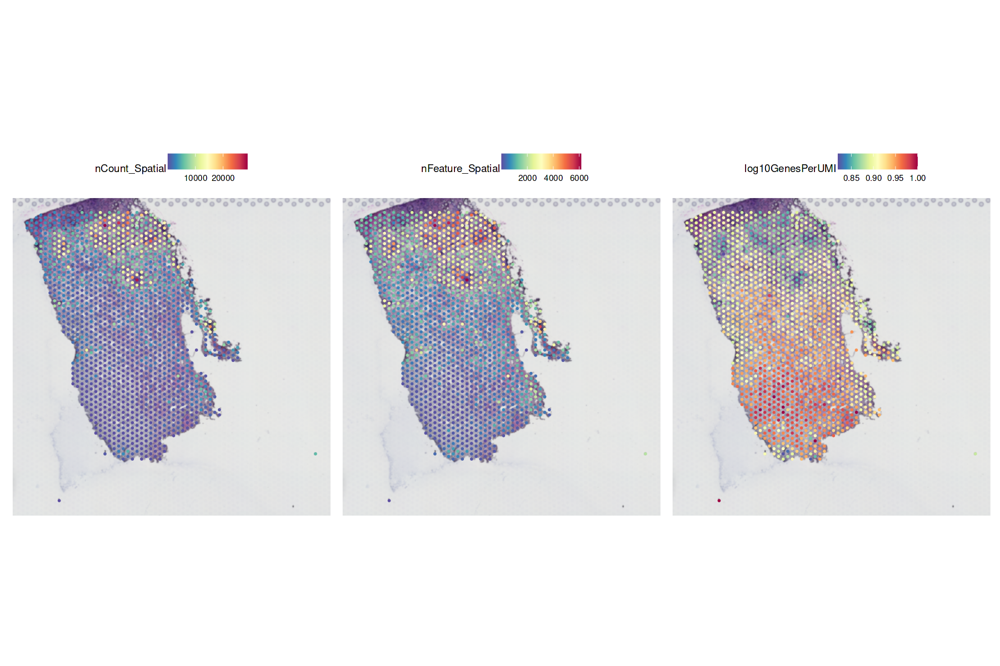

In [13]:
SpatialFeaturePlot(st$A1, features=c('nCount_Spatial','nFeature_Spatial','log10GenesPerUMI'))

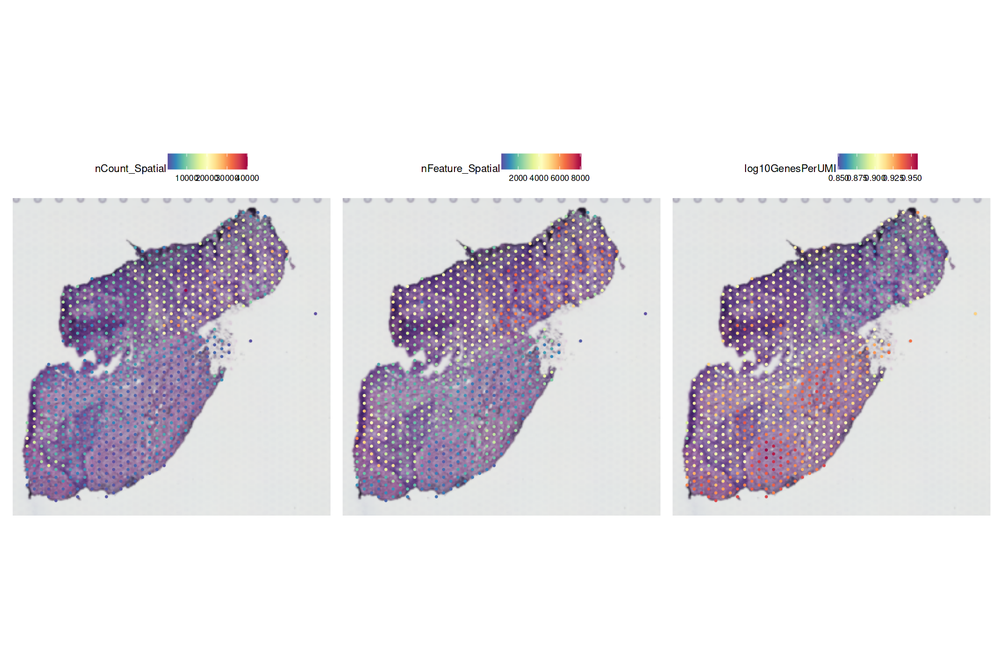

In [14]:
SpatialFeaturePlot(st$B1, features=c('nCount_Spatial','nFeature_Spatial','log10GenesPerUMI'))

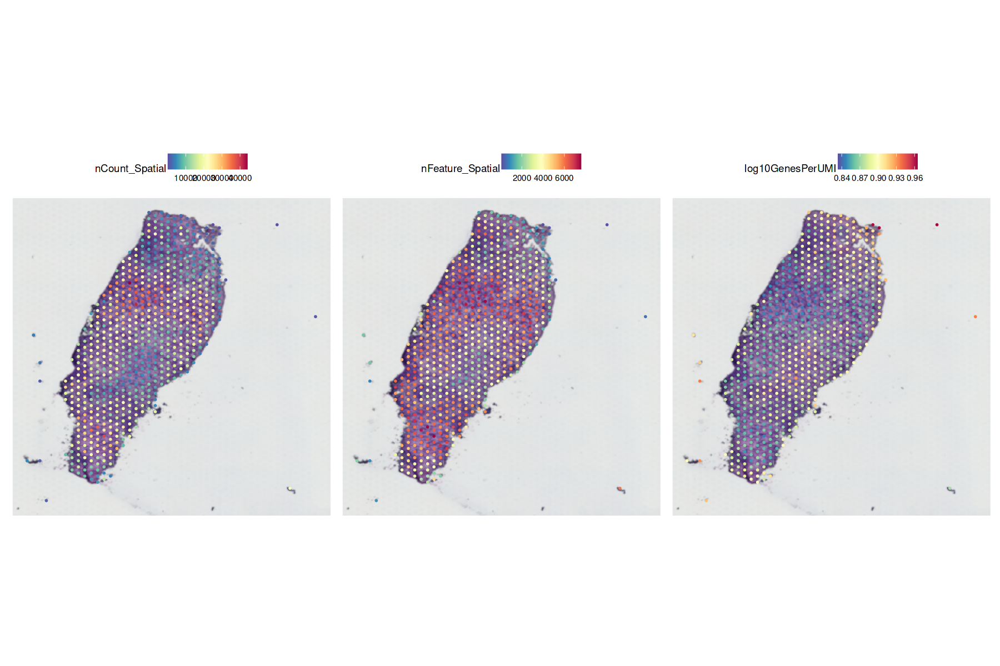

In [15]:
SpatialFeaturePlot(st$C1, features=c('nCount_Spatial','nFeature_Spatial','log10GenesPerUMI'))

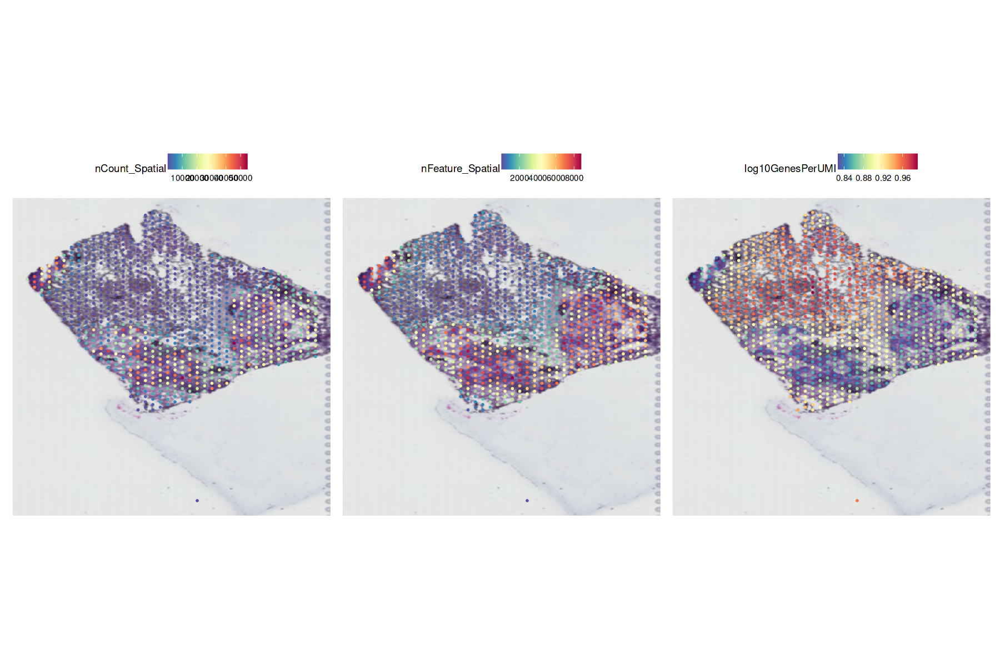

In [16]:
SpatialFeaturePlot(st$D1, features=c('nCount_Spatial','nFeature_Spatial','log10GenesPerUMI'))

# print mitc precentage 
# filter genes based on mito genes

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 17364 rows containing non-finite outside the scale range
(`stat_density()`).”


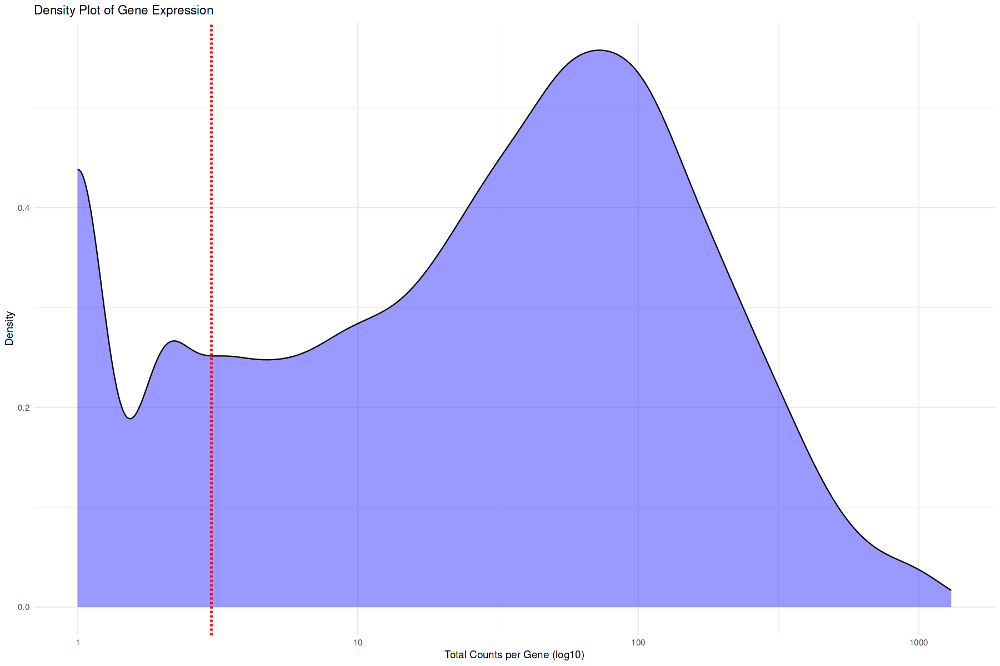

In [17]:
gene_sums <- rowSums(st$A1@assays$Spatial$counts > 0)  # Sum of gene counts across spots

gene_sums_df <- data.frame(Gene = names(gene_sums), Total_Counts = gene_sums)

ggplot(gene_sums_df, aes(x = Total_Counts)) +
  geom_density(fill = "blue", alpha = 0.4) +
  scale_x_log10() +  # Log scale for better visualization
  theme_minimal() +
  labs(title = "Density Plot of Gene Expression", x = "Total Counts per Gene (log10)", y = "Density")+
  geom_vline(xintercept = 3, color = "red", linetype = "dashed", size = 1)


Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 15985 rows containing non-finite outside the scale range
(`stat_density()`).”


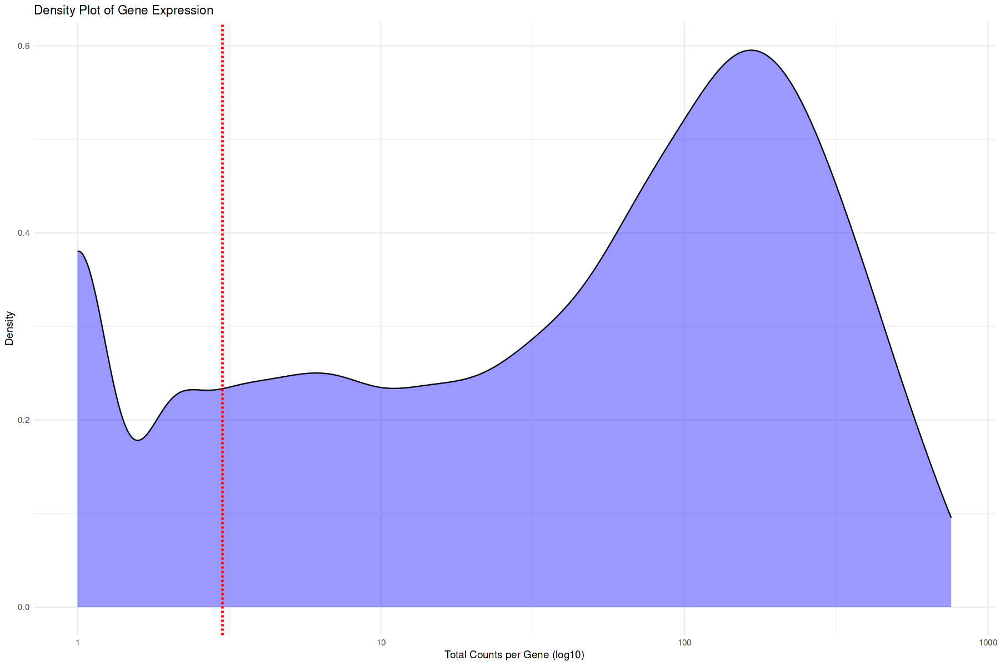

In [18]:
gene_sums <- rowSums(st$B1@assays$Spatial$counts > 0)  # Sum of gene counts across spots

gene_sums_df <- data.frame(Gene = names(gene_sums), Total_Counts = gene_sums)

ggplot(gene_sums_df, aes(x = Total_Counts)) +
  geom_density(fill = "blue", alpha = 0.4) +
  scale_x_log10() +  # Log scale for better visualization
  theme_minimal() +
  labs(title = "Density Plot of Gene Expression", x = "Total Counts per Gene (log10)", y = "Density")+
  geom_vline(xintercept = 3, color = "red", linetype = "dashed", size = 1)


Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 14875 rows containing non-finite outside the scale range
(`stat_density()`).”


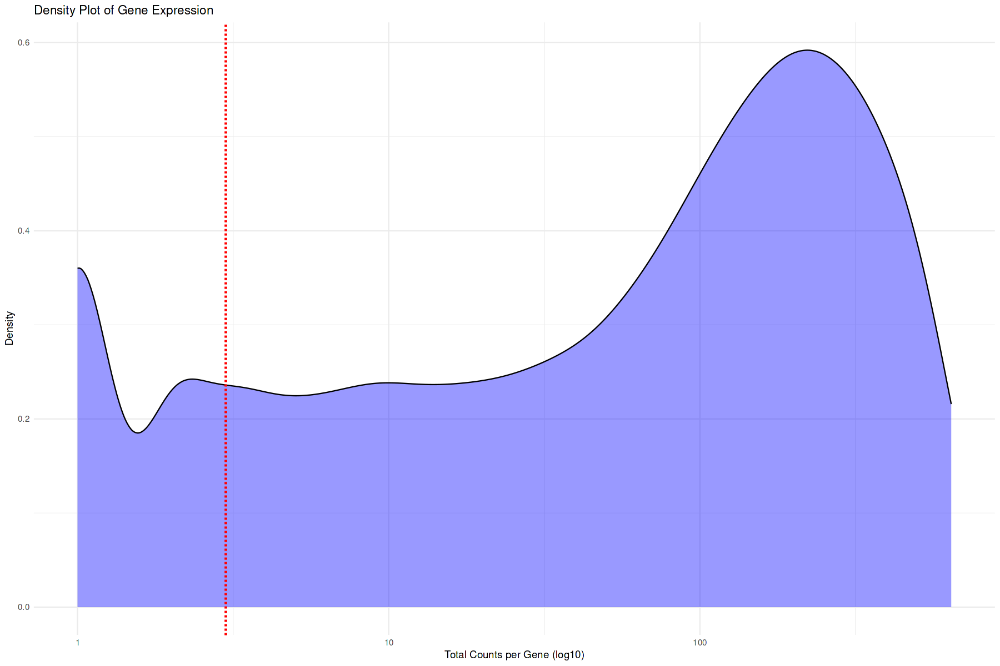

In [19]:
gene_sums <- rowSums(st$C1@assays$Spatial$counts > 0)  # Sum of gene counts across spots

gene_sums_df <- data.frame(Gene = names(gene_sums), Total_Counts = gene_sums)

ggplot(gene_sums_df, aes(x = Total_Counts)) +
  geom_density(fill = "blue", alpha = 0.4) +
  scale_x_log10() +  # Log scale for better visualization
  theme_minimal() +
  labs(title = "Density Plot of Gene Expression", x = "Total Counts per Gene (log10)", y = "Density")+
  geom_vline(xintercept = 3, color = "red", linetype = "dashed", size = 1)


Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 15302 rows containing non-finite outside the scale range
(`stat_density()`).”


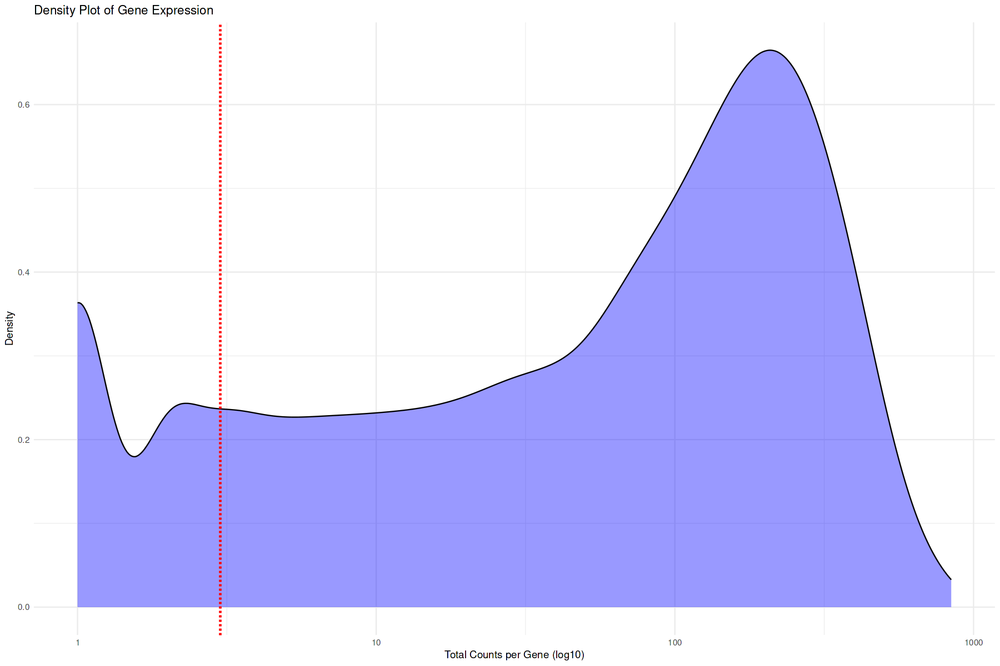

In [20]:
gene_sums <- rowSums(st$D1@assays$Spatial$counts > 0)  # Sum of gene counts across spots

gene_sums_df <- data.frame(Gene = names(gene_sums), Total_Counts = gene_sums)

ggplot(gene_sums_df, aes(x = Total_Counts)) +
  geom_density(fill = "blue", alpha = 0.4) +
  scale_x_log10() +  # Log scale for better visualization
  theme_minimal() +
  labs(title = "Density Plot of Gene Expression", x = "Total Counts per Gene (log10)", y = "Density")+
  geom_vline(xintercept = 3, color = "red", linetype = "dashed", size = 1)


In [21]:
dim(st$A1)

[1] 36601  1333

In [25]:
min_spots <- 3  # Removing genes expressed in fewer than 3 spots
for (tissue_name in names(st)) {
    st[[tissue_name]] <- subset(st[[tissue_name]], 
                                features = rownames(st[[tissue_name]])[Matrix::rowSums(st[[tissue_name]]@assays$Spatial$counts > 0) > min_spots])
}


Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV o

In [26]:
dim(st$A1)
dim(st$B1)
dim(st$C1)
dim(st$D1)
# removed genes

[1] 15389  1333

[1] 16888   757

[1] 17798   642

[1] 17475   849

## mitochondrial genes weren't totaly removed as it didn't affect the clustering badly it impoved it

In [1]:
for (tissue_name in names(st)){
    st[[tissue_name]]= SCTransform(st[[tissue_name]], assay ='Spatial')
}
# output of this cell was removed to decrease notebook storage 

In [28]:
names(st$A1@assays)

[1] "Spatial" "SCT"

In [29]:
for ( tissue in names(st)){
    st[[tissue]] <- FindVariableFeatures(st[[tissue]])
    }

In [30]:
for ( tissue in names(st)){
    # st[[tissue]] <- ScaleData(st[[tissue]])
    st[[tissue]] <- RunPCA(st[[tissue]])
    }


PC_ 1 
Positive:  IGFBP7, AQP1, ADIRF, VWF, CCL14, A2M, SPARCL1, ACTA2, ACKR1, TAGLN 
	   PECAM1, MYL9, VIM, IFITM3, EPAS1, MGP, CXCL14, MCAM, IFITM2, MYH11 
	   NOTCH3, PLVAP, TM4SF1, MT-CO3, DEPP1, EHD2, ESAM, CLDN5, ECSCR, TPM2 
Negative:  IGHG1, IGHG3, IGLC3, FTL, APOC1, IGHG2, IGHA1, APOE, KRT81, FTH1 
	   IGLC2, IGHGP, KRT19, IGKC, IGLC1, TIMP1, CD24, LYZ, KRT7, TFF3 
	   IFI30, IGHG4, CD74, CTSD, CYBA, ITGB2, FN1, CCL5, CXCL9, TYROBP 
PC_ 2 
Positive:  IGHG3, IGHG4, IGHG1, IGHA1, JCHAIN, IGLC2, IGLC1, IGLC3, IGKC, IGHM 
	   IGHGP, IGHG2, MGP, MZB1, C3, SSR4, IGLC7, MALAT1, CHI3L1, AEBP1 
	   TXNDC5, CLU, IGFBP6, CLDN5, H19, EGFL7, VWF, JSRP1, FBLN1, AL627171.2 
Negative:  FTL, FTH1, TMSB10, FN1, RPS15A, RPL41, ADH1B, RPS27A, SAA1, CD74 
	   FABP4, RPS12, MT-CO1, MGST1, RPL22, COMP, PPP1R1A, B2M, EEF1A1, RPS2 
	   RPL10, RPL34, RPLP1, RPL30, RPS23, IFI30, RPL11, RPL37, TMSB4X, CCN5 
PC_ 3 
Positive:  C3, SAA1, PI16, CFD, DCN, COL1A1, FABP4, GPX3, ADH1B, COL1A2 
	   MT-ND3, MGP, S

In [31]:
n.cores=40
splitting = 100
spatial.resolution = 0.3
aa_noise=3
gene_number=2000
graph = 20
seed=123

In [4]:
for (tissue in names(st)){
    st[[tissue]] <- RunKODAMAmatrix(st[[tissue]],
                           FUN = "fastpls",
                           landmarks = 100000,
                           splitting = 300,
                           ncomp=50
                           )
    saveRDS(st[[tissue]], file = paste0(tissue, '.rds'))
    }
# output was removed 

In [9]:
files <- c("A1", "B1", "C1", "D1")  # List of tissue names
st <- list()  # Empty list to store Seurat objects
for (file in files) {
    seurat_obj=readRDS(paste0(file,'.rds'))
  # Store in list
  st[[file]] <- seurat_obj
}


In [44]:
library(bluster)
library(igraph)
library(KODAMA)
library(KODAMAextra)
library(Seurat)
library(ggplot2)

In [45]:
config=umap.defaults
config$n_sgd_threads = "auto"
for (tissue_name in names(st)) {
    st[[tissue_name]] <- RunKODAMAvisualization(st[[tissue_name]],method="UMAP",config=config)
}

In [46]:
kodama_dims <- Embeddings(st[['A1']], reduction='KODAMA')

In [47]:
snn_graph <- bluster::makeSNNGraph(kodama_dims, k = 30) 

In [48]:
snn_graph

IGRAPH 5fd3e59 U-W- 1333 59704 -- 
+ attr: weight (e/n)
+ edges from 5fd3e59:
 [1]  1-- 2  3-- 4  8-- 9  3--10  4--10 13--17  2--18  8--19  9--19  1--19
[11] 13--19 12--20 13--22 17--22  6--24 24--25  6--25 10--26  3--26 12--28
[21] 20--28  7--29 29--30 21--30  7--30 26--31 10--31  3--31  5--32  1--33
[31]  2--33 19--33 23--33 32--34  5--34 28--34  5--35 34--35 22--36 13--36
[41] 29--37  7--37 36--37 30--37 27--38 26--39 31--39 10--39  3--39 17--39
[51] 10--40 26--40 39--40  3--40 31--40  7--40 21--40  3--41 10--41  4--41
[61] 21--41 40--41 38--42 27--42  7--43 36--43 39--43 29--43 37--43 40--43
[71] 22--43 17--44 22--44 13--44 17--45 44--45 39--45 31--45 26--45 27--46
+ ... omitted several edges

In [49]:
clusters <- igraph::cluster_walktrap(snn_graph)


cluster_labels <- as.character(membership(clusters))

In [50]:
unique(cluster_labels)

[1] "3"  "2"  "1"  "5"  "4"  "7"  "12" "6"  "8"  "11" "10" "9"

In [51]:
st[['A1']]@meta.data$clusters <- cluster_labels


In [52]:
df=data.frame(kodama_dims)
df['KODAMA']=st[['A1']]@meta.data$clusters

In [53]:
head(df)

,Dimensions_1,Dimensions_2,KODAMA
,<dbl>,<dbl>,<chr>
AAACCGGGTAGGTACC-1,-0.6411632,0.2094256,3
AAACCTCATGAAGTTG-1,-0.3762452,-0.2422604,3
AAACGAGACGGTTGAT-1,1.0313151,1.8009718,2
AAACTGCTGGCTCCAA-1,1.4256114,1.9185186,2
AAAGACTGGGCGCTTT-1,-0.3804636,-3.6231963,1
AAAGGCTCTCGCGCCG-1,3.5426915,0.7396736,5


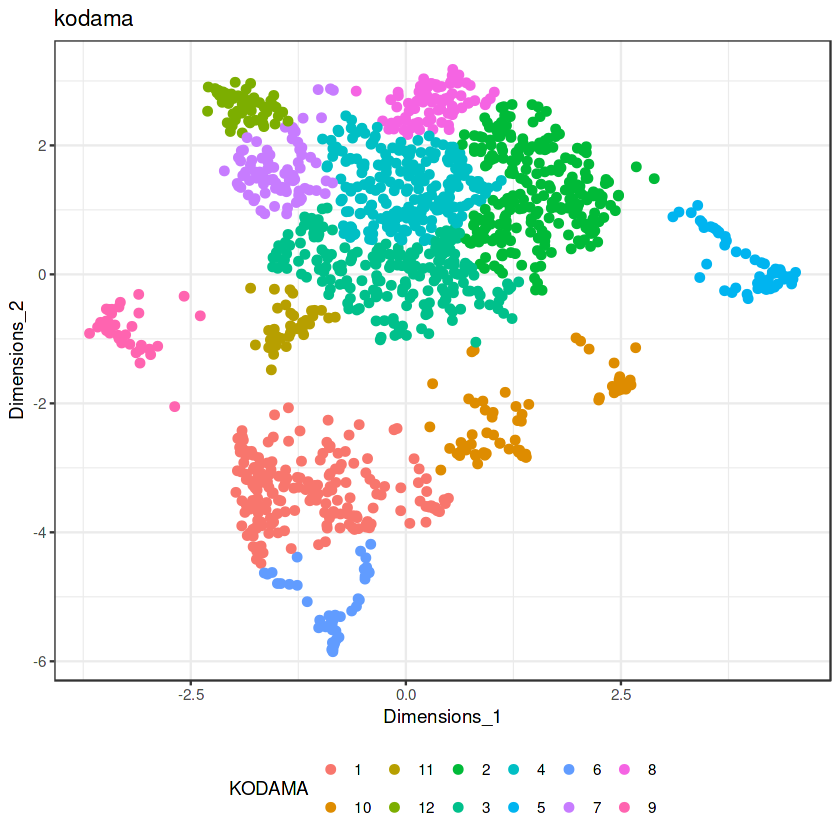

In [54]:
ggplot(df, aes(Dimensions_1, Dimensions_2, color = KODAMA)) +labs(title="kodama") +
  geom_point(size = 2) +
  theme_bw() + theme(legend.position = "bottom")+
  guides(color = guide_legend(nrow = 2, 
                              override.aes = list(size = 2)))

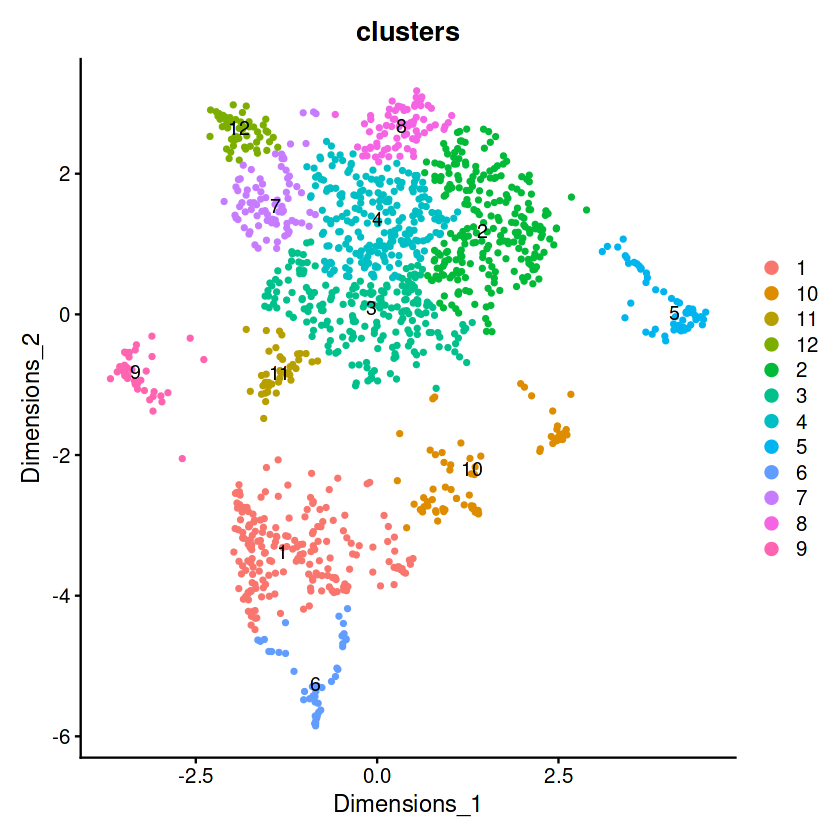

In [55]:
DimPlot(st[['A1']],reduction='KODAMA' ,c(1, 2), label =TRUE ,group.by='clusters')

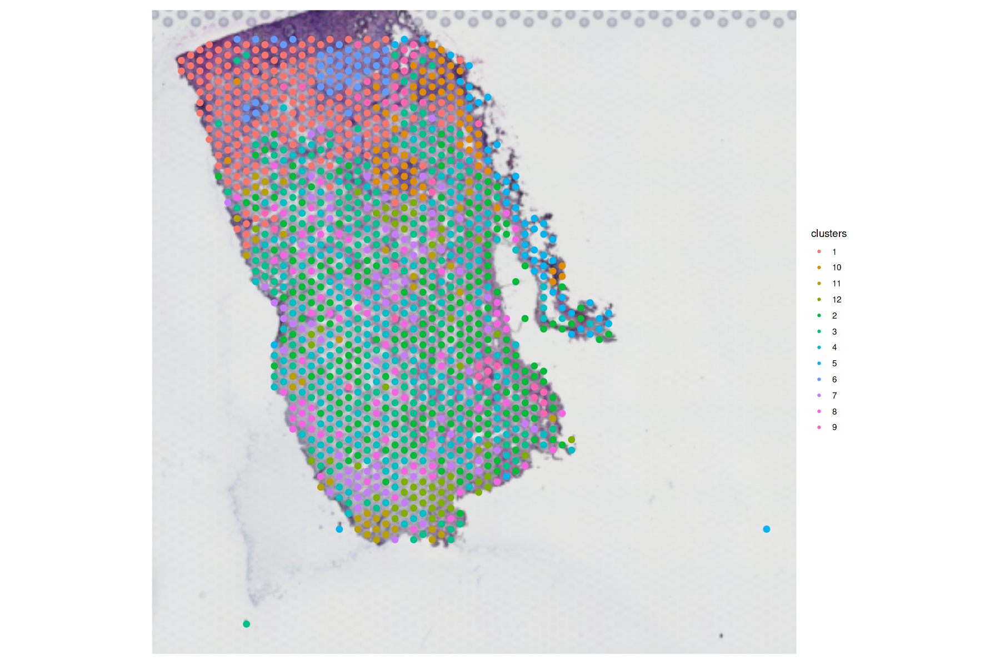

In [61]:
SpatialDimPlot(st[['A1']], group.by='clusters',pt.size.factor=2)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


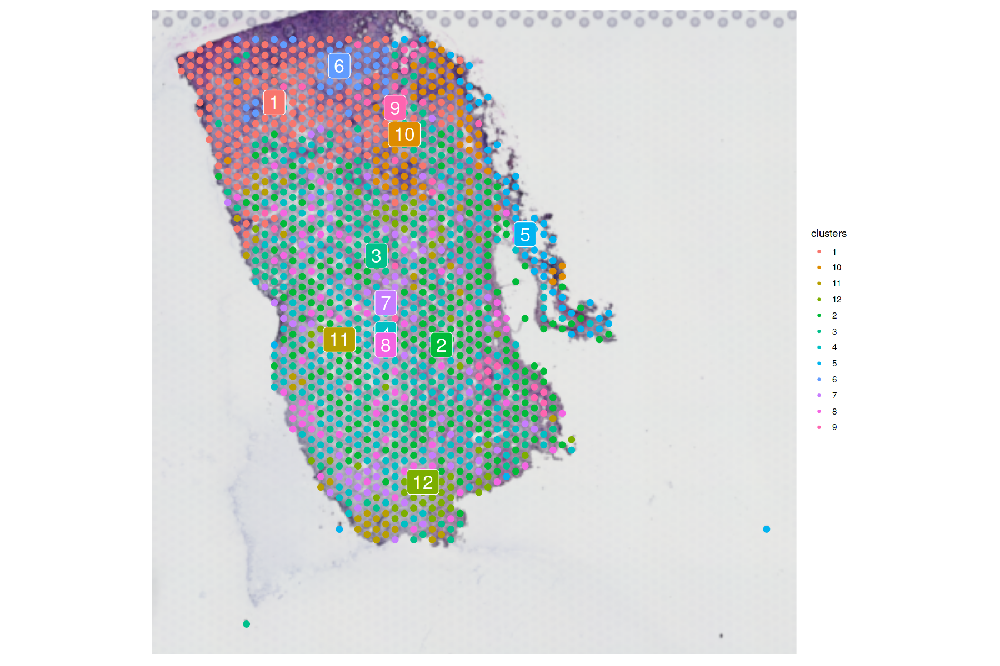

In [62]:
SpatialDimPlot(st[['A1']], group.by='clusters',pt.size.factor=2, label= TRUE)

# patient 1 av ethe highest degree of cancer ⅢC/T2N3aM0ⅢC/T2N3aM0

# B1 clustering

In [63]:
kodama_dims <- Embeddings(st[['B1']], reduction='KODAMA')

In [64]:
snn_graph <- bluster::makeSNNGraph(kodama_dims, k = 40) 

In [65]:
snn_graph

IGRAPH e066e1e U-W- 757 39953 -- 
+ attr: weight (e/n)
+ edges from e066e1e:
 [1]  3-- 4  1-- 5  2-- 6  1-- 7  5-- 7  1-- 8  7-- 8  4--11  6--12  2--12
[11] 10--13  3--15 10--15  2--16  6--16 15--17  3--17  6--18  2--18 12--18
[21] 13--18 16--18 10--19 13--19  8--19  7--20  1--20  7--21 20--21  1--21
[31] 22--23 23--24 12--24  6--24  2--24 22--24 18--24 16--24  3--25 17--25
[41] 15--25  4--25 20--26 21--26  7--26 14--27  4--27 16--28  2--28 18--28
[51] 13--28 15--28 17--29 25--29  3--29 15--29  8--30 19--30  1--30  9--31
[61] 11--32  4--32 31--32  9--32 30--33  8--33 19--33  1--33 10--33  1--34
[71]  8--34 30--34 33--34  7--34  5--34 20--34 21--34 28--35 16--35  2--35
+ ... omitted several edges

In [66]:
clusters <- igraph::cluster_walktrap(snn_graph)


cluster_labels <- as.character(membership(clusters))
unique(cluster_labels)

[1] "1" "3" "2" "4" "5" "7" "6" "8"

In [67]:
st[['B1']]@meta.data$clusters <- cluster_labels
df=data.frame(kodama_dims)
df['KODAMA']=st[['B1']]@meta.data$clusters

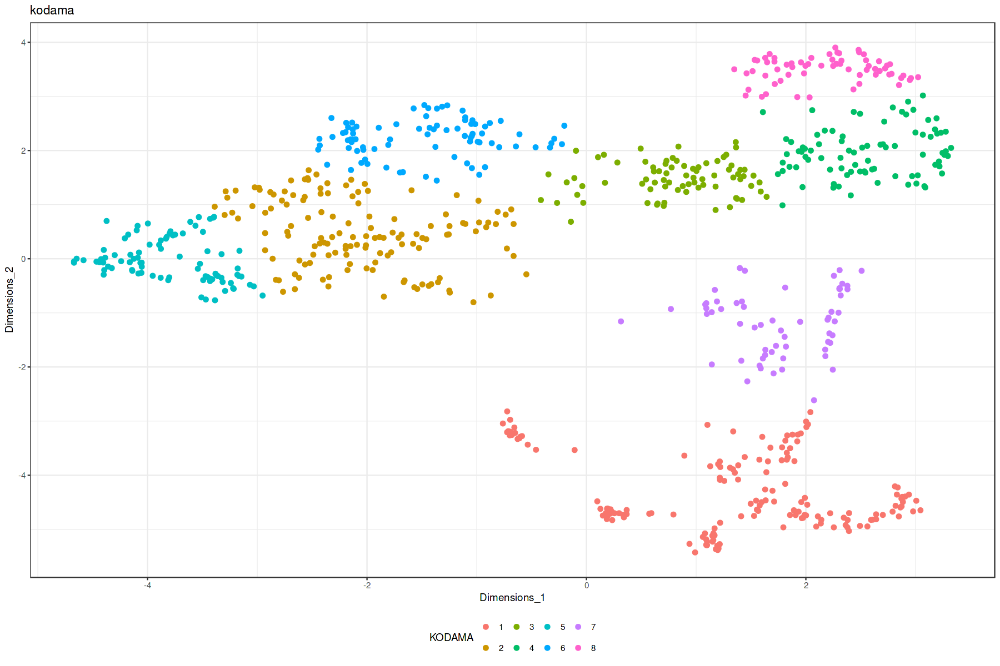

In [68]:
ggplot(df, aes(Dimensions_1, Dimensions_2, color = KODAMA)) +labs(title="kodama") +
  geom_point(size = 2) +
  theme_bw() + theme(legend.position = "bottom")+
  guides(color = guide_legend(nrow = 2, 
                              override.aes = list(size = 2)))

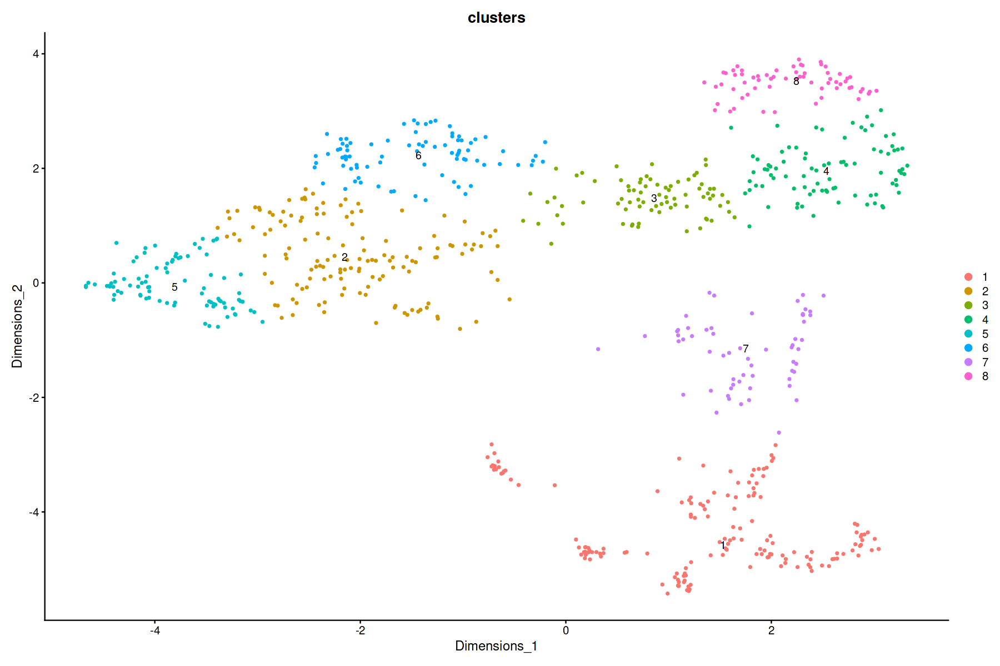

In [69]:
DimPlot(st[['B1']],reduction='KODAMA' ,c(1, 2), label =TRUE ,group.by='clusters')

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


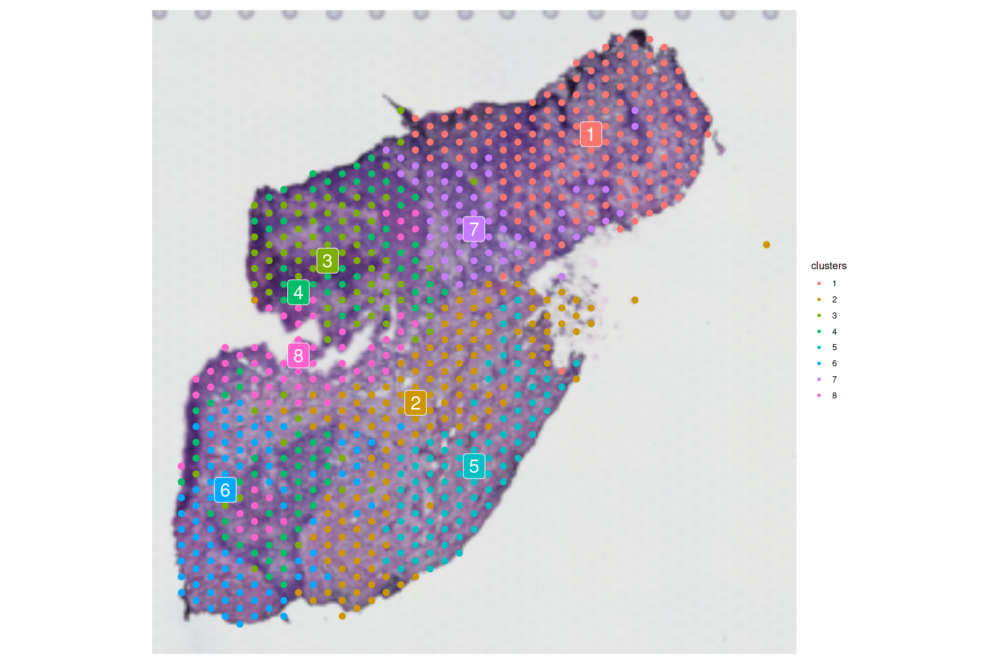

In [70]:
SpatialDimPlot(st[['B1']], group.by='clusters',pt.size.factor=2,label =TRUE)

# C1 clustering

In [71]:
kodama_dims <- Embeddings(st[['C1']], reduction='KODAMA')

In [72]:
snn_graph <- bluster::makeSNNGraph(kodama_dims, k = 30) 

In [73]:
snn_graph

IGRAPH 352b435 U-W- 642 25876 -- 
+ attr: weight (e/n)
+ edges from 352b435:
 [1]  2-- 3  1-- 4  3-- 6  2-- 6  3-- 7  2-- 7  6-- 7  7-- 8  3-- 8  4--11
[11]  2--11  6--11  3--11  1--11 12--13 14--15  9--17  8--17  2--17  7--17
[21] 13--18 16--19 12--20 18--20 13--20 10--20 15--21 21--23 15--23  2--24
[31]  9--24 17--24 14--25 15--25 21--25  5--25 23--25 22--26 13--27 12--27
[41] 20--27 10--28 20--28 24--28 18--29 13--29 12--29 20--29 27--29  3--30
[51]  6--30  7--30 11--30  2--30  1--31 22--32 26--32 21--33 25--33 23--33
[61] 15--33 14--33 32--34 22--34 10--34 26--34 19--35 16--35 26--36 22--36
[71] 32--36 34--36 34--37 22--37 36--37 26--37 32--37 10--37  4--38 27--38
+ ... omitted several edges

In [74]:
clusters <- igraph::cluster_walktrap(snn_graph)


cluster_labels <- as.character(membership(clusters))
unique(cluster_labels)

[1] "2" "4" "1" "3" "5" "7" "6"

In [75]:
st[['C1']]@meta.data$clusters <- cluster_labels
df=data.frame(kodama_dims)
df['KODAMA']=st[['C1']]@meta.data$clusters

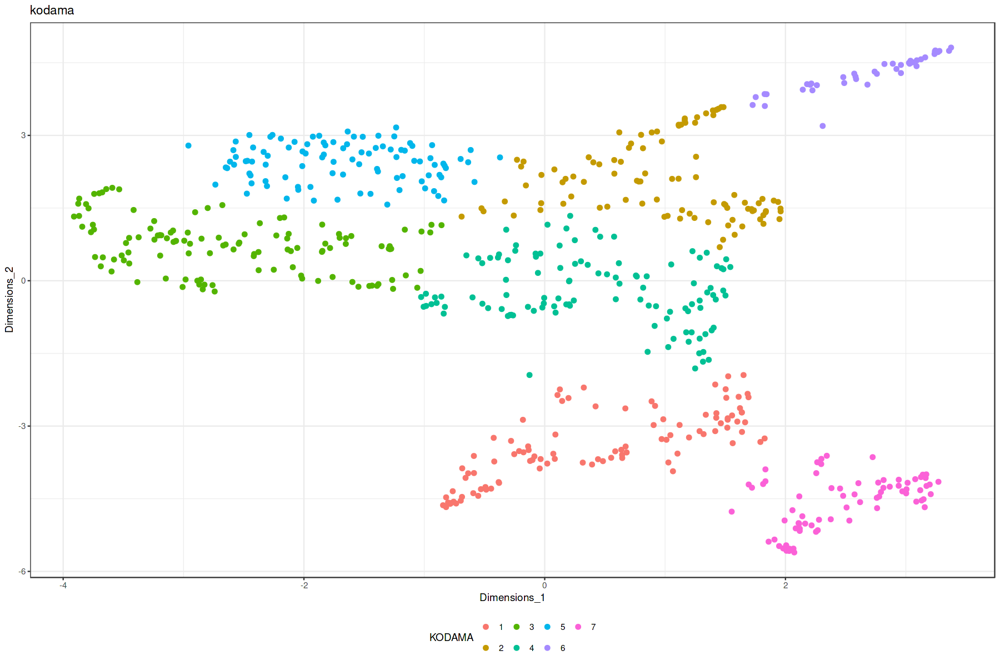

In [76]:
ggplot(df, aes(Dimensions_1, Dimensions_2, color = KODAMA)) +labs(title="kodama") +
  geom_point(size = 2) +
  theme_bw() + theme(legend.position = "bottom")+
  guides(color = guide_legend(nrow = 2, 
                              override.aes = list(size = 2)))

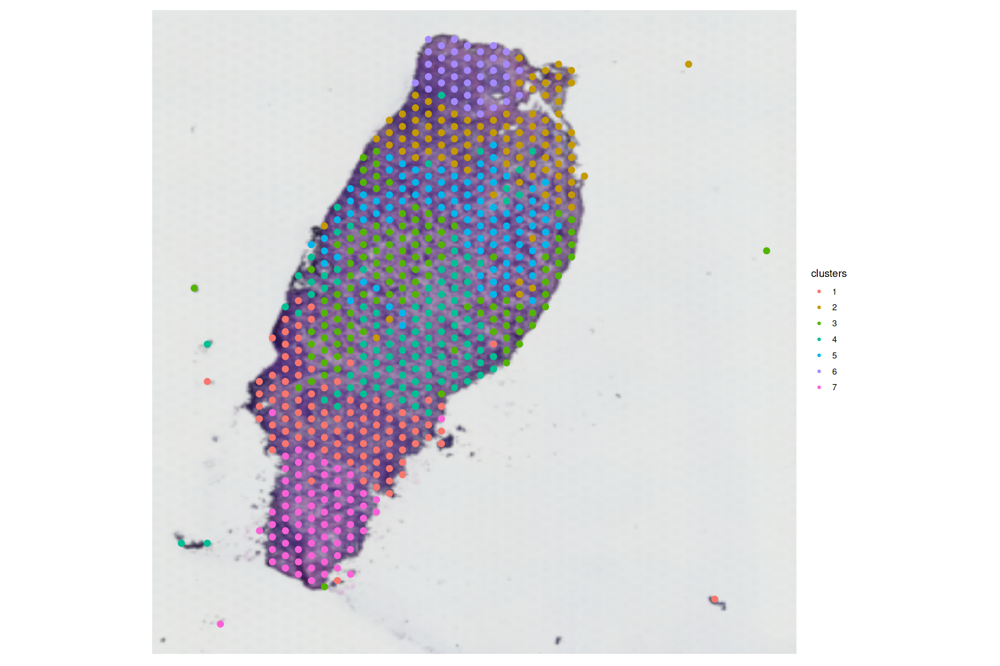

In [77]:
SpatialDimPlot(st[['C1']], group.by='clusters',pt.size.factor=2)

# D1 clustering

In [78]:
kodama_dims <- Embeddings(st[['D1']], reduction='KODAMA')

In [79]:
snn_graph <- bluster::makeSNNGraph(kodama_dims, k = 30) 

In [80]:
snn_graph

IGRAPH 1b6d5e5 U-W- 849 36176 -- 
+ attr: weight (e/n)
+ edges from 1b6d5e5:
 [1]  2-- 6  6-- 9  1--10  7--11 12--13 13--14  9--16  6--16  4--16 17--20
[11]  7--21 11--21  2--22 21--22  1--23 10--23 14--24 13--24 22--25  2--25
[21] 14--26 13--26 24--26 12--27 13--27 15--27  3--28  8--29  4--29 19--30
[31] 24--31 26--31 14--31 13--31 24--32  9--32 31--32 29--33  8--33  4--33
[41] 27--34 22--34 31--35 26--35 14--35 32--35 24--35  9--35 13--35 11--36
[51]  7--36 21--36 31--37 13--37 24--37 14--37 26--37 35--37 32--37 12--37
[61]  5--38 14--38 26--38  8--39 33--39 29--39 36--40 11--40  7--40 21--40
[71] 19--41 30--41 13--42 37--42 12--42 31--42 27--42 14--42 24--42 42--43
+ ... omitted several edges

In [81]:
clusters <- igraph::cluster_walktrap(snn_graph)


cluster_labels <- as.character(membership(clusters))
unique(cluster_labels)

[1] "6" "4" "3" "5" "2" "1" "7" "9" "8"

In [82]:
st[['D1']]@meta.data$clusters <- cluster_labels
df=data.frame(kodama_dims)
df['KODAMA']=st[['D1']]@meta.data$clusters

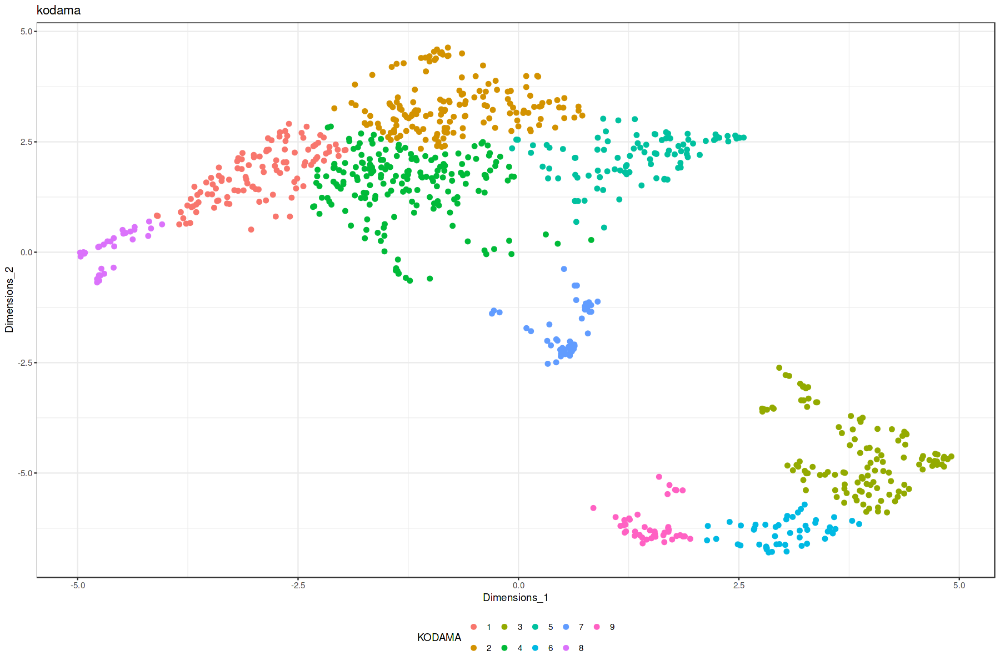

In [83]:
ggplot(df, aes(Dimensions_1, Dimensions_2, color = KODAMA)) +labs(title="kodama") +
  geom_point(size = 2) +
  theme_bw() + theme(legend.position = "bottom")+
  guides(color = guide_legend(nrow = 2, 
                              override.aes = list(size = 2)))

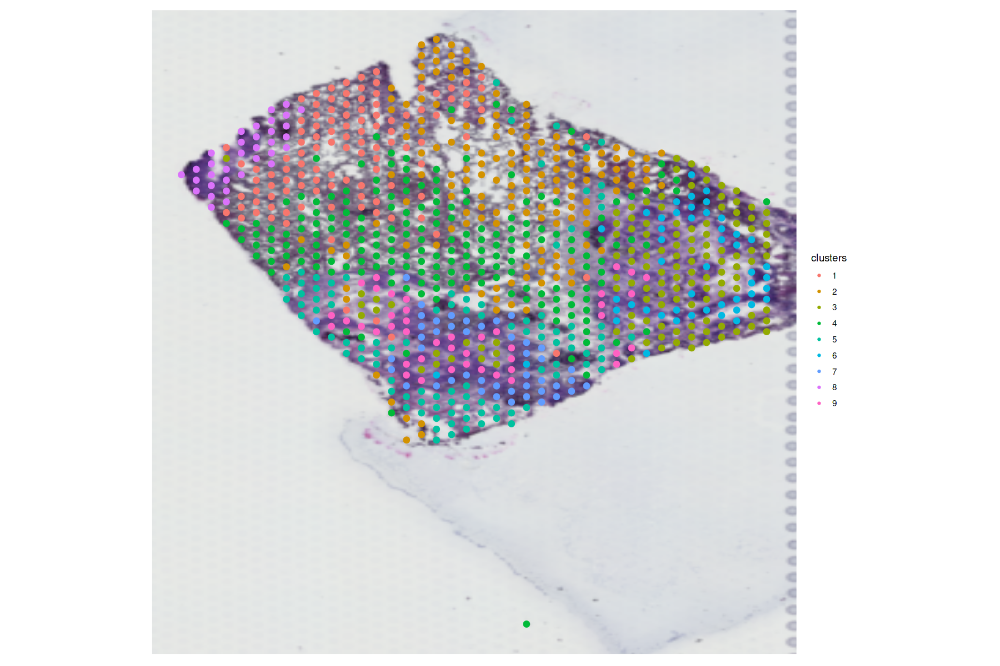

In [84]:
SpatialDimPlot(st[['D1']], group.by='clusters',pt.size.factor=2)

In [85]:
markers<- FindAllMarkers(st, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

ERROR: Error in UseMethod(generic = "Idents", object = object): no applicable method for 'Idents' applied to an object of class "list"


In [ ]:
for (cluster in unique(st@meta.data$cluster)) {
    markers <- FindMarkers(st, 
                           ident.1 = cluster, 
                           group.by = "clusters",
                           only.pos = TRUE, 
                           min.pct = 0.25, 
                           logfc.threshold = 0.25)

    write.csv(markers, file = paste0("Cluster_", cluster, "_variable_genes.csv"), row.names = TRUE)
}